<div class="frontmatter text-center">
<h1>Geospatial Data Science</h1>
<h2>Exam project code</h2>
<h3>IT University of Copenhagen, Spring 2022</h3>
<h3>Group: Nina Sand Horup & Ida Thrane</h3>
</div>

In [1]:
# import libraries needed
import geopandas as gpd
import osmnx as ox
import networkx as nx
import pandas as pd
import geopandas as gpd


%matplotlib inline
ox.__version__

'1.0.1'

In [2]:
from shapely.geometry import Point, Polygon

In [3]:
# libraries for plotting
import matplotlib.pyplot as plt
import numpy as np


# Input parameters

In [ ]:
# Input parameters for the small test graph
current_position = (55.6935280, 12.5489348) # Could in practice just come from a GPS location
small_graph_radius = 2500

## Import area

In [638]:
%%time
# Import area from address using radius in meters
G = ox.graph_from_point(
    current_position,
    dist=small_graph_radius,
    dist_type="network",
    network_type="all",
    simplify = True
)


# We can simplify the graph further by converting to a non-directed. 
# Since the app assumes that the user is on foot (or at least on bike), the one-way roads 
# are not that important

U = ox.utils_graph.get_undirected(G) # U is the non-directed graph.

# Note that this takes extra time - does it help us later on?

CPU times: user 23.6 s, sys: 611 ms, total: 24.2 s
Wall time: 32 s


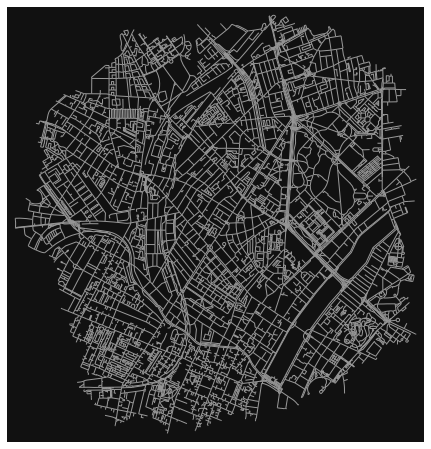

In [667]:
fig, ax = ox.plot_graph(U, node_size=0, show = False, close = False);

#ax.set_title("Graph: section of Copenhagen", fontsize = 20)

plt.show()

# Import parks and water

In [685]:
# Get water

water_tags = {"waterway": ["riverbank", "canal", "dock"],
        "water": ["river", "canal", "reservoir"],
        "natural": ["bay", "water"],
        "place": ["sea", "ocean"]}

water = ox.geometries_from_point((55.6935280, 12.5489348), tags = water_tags, dist=2500)

water_polygons = water["geometry"]

# Get parks and cemetaries
park_tags = {"leisure": "park", "landuse": "cemetery"}

parks = ox.geometries_from_point((55.6935280, 12.5489348), tags = park_tags, dist=2500)

parks_polygons = parks["geometry"]

### Add area information

How to calculate area from ellipsoids:


https://stackoverflow.com/questions/23697374/calculate-polygon-area-in-planar-units-e-g-square-meters-in-shapely

In [826]:
# Calculate water areas
water_area_list = []
for poly in water_polygons: 
    area = poly.area
    water_area_list.append(area)

# Add the area information back into the geodataframe

water["area"] = water_area_list

In [827]:

# Calculate park areas
park_area_list = []
for poly in parks_polygons:
    area = poly.area
    park_area_list.append(area)

# Add the area information back into the geodataframe

parks["area"] = park_area_list



# Getting some destinations



## Converting destinations to actual nodes

Later, we want to turn our geocoordinates of locations into OSM IDs.
Ideally, we would be using `osmnx.distance.nearest_nodes`. However, our docker is running an outdated OSMnx version where this function does not work (and its predecessor, ` get_nearest_node`, is deprecated). A possible, neither efficient nor elegant but enough-for-our-purposes workaround is to look for the node that minimizes euclidean distance to the location. 

Note that we still want to plot the destionation at its actual location to ensure that the user is not confused.

In [784]:

# Which OSMIDs do these nodes correspond to, now that we have "simplified" the graph?
# Workaround to use instead of osmnx.distance.nearest_nodes (unavailable in our docker image): 
# https://osmnx.readthedocs.io/en/stable/osmnx.html?highlight=digraph#osmnx.distance.nearest_nodes
# here the geodataframe comes in handy for the apply functions:

# Note that these functions are heavily inspired from the exercise 8 solutions

def get_nearest_node(input_coordinate, G):
    nodes = ox.utils_graph.graph_to_gdfs(G, nodes=True, edges=False, node_geometry=True)

    distance = nodes.apply(lambda x: np.sqrt((x.y - input_coordinate[0])**2 + (x.x - input_coordinate[1])**2) , axis = 1)
    output = distance.idxmin()
    return output


def get_nearest_nodes(input_coordinates, G):
    nodes = ox.utils_graph.graph_to_gdfs(G, nodes=True, edges=False, node_geometry=True)
    
    output = []
    for i in range(len(input_coordinates)):
        distances = nodes.apply(lambda x: np.sqrt((x.y - input_coordinates[i][0])**2 + (x.x - input_coordinates[i][1])**2) , axis = 1)
        nearest_node = distances.idxmin()
        output.append(nearest_node)
    return output




### Toy destinations

In [584]:
# Here I have just a random list of some points

orig_coord = [55.6974030, 12.5513320]
dest_coord_list = [(55.6915237, 12.5488367), (55.695237, 12.5678367), (55.6995237, 12.5528367)]



/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


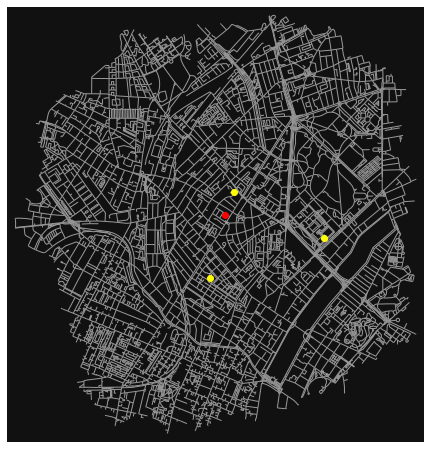

In [585]:
# Let's quickly plot the toy destinations
fig, ax = ox.plot_graph(U, node_size=0, show=False, close=False);

# Normally osmnx will instantly display the plot, so we set show to be false
# Osmnx will also by default close the plot after showing, sp we set close to false so we can keep the plot for the scatters

ax.scatter(orig_coord[1], orig_coord[0], c='red')
ax.scatter(dest_coord_list[0][1], dest_coord_list[0][0], c='yellow')
ax.scatter(dest_coord_list[1][1], dest_coord_list[1][0], c='yellow')
ax.scatter(dest_coord_list[2][1], dest_coord_list[2][0], c='yellow')

plt.show()

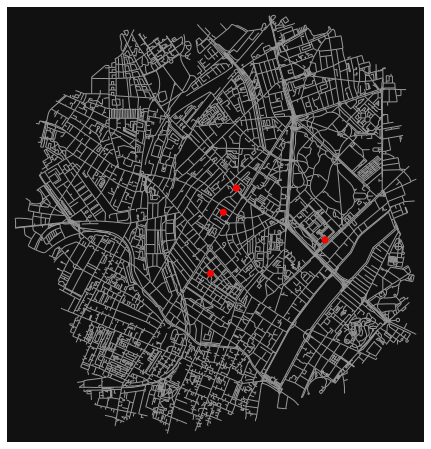

In [785]:
# Converting the toy desinations coordinates into nodes which exist on our graph
orig_id = get_nearest_node(orig_coord, U)
dest_ids = get_nearest_nodes(dest_coord_list, U)

all_nodes = dest_ids + [orig_id]

# create node weights
w = [50 if node in all_nodes else 0 for node in U.nodes]
#nx.set_node_attributes(U, w, 'weight')

# We plot the nodes which minimizes the distance to the coordinates to check that the method works
fig, ax = ox.plot_graph(U, node_size=w, node_color = 'red');


## Real destinations

#### Download the destinations

We need some kind of initial filter so we do not have to calculate routes for all of the possible combinations of restaurants/bars/attractions. 

Ideas:

- 1: filter so we only get points (this is more a practicality)
- 2: **IDA** filter according to google API (only above 3 stars and not more than two or three dollar signs)
- 3: check if parks/water is nearby (within 300 meters for example). But only bigger parks/bigger water areas



In [642]:
# Let's get some actual destinations
radial_dist = 1000

restaurants = ox.geometries_from_point(current_position, tags = {"amenity": "restaurant"}, dist=radial_dist)
bars = ox.geometries_from_point(current_position, tags = {"amenity": "bar"}, dist=radial_dist)
attractions = ox.geometries_from_point(current_position, tags = {"tourism": True}, dist=radial_dist)




In [644]:
len(restaurants), len(bars), len(attractions)


(57, 58, 30)

In [776]:
# Filter so we only get points: 

restaurants = restaurants[restaurants.geometry.geom_type == "Point"]
bars = bars[bars.geometry.geom_type == "Point"]
attractions = attractions[attractions.geometry.geom_type == "Point"]

#### Get coordinates

In [762]:
# We have the desinations in the form of shapely points and we need the geocoordinates.
def get_coords_from_gdf(gdf):
    geometries =  gdf.geometry
    coords = []
    for geom in geometries: 
        x = geom.x
        y = geom.y
        
        coord = (y,x)
        coords.append(coord)
        
    return coords

In [777]:
# Get coords

restaurant_coords = get_coords_from_gdf(restaurants)
bar_coords = get_coords_from_gdf(bars)
attraction_coords = get_coords_from_gdf(attractions)

# Add coordinates back into the gdf's
restaurants["coordinates"] = restaurant_coords
bars["coordinates"] = bar_coords
attractions["coordinates"] = attraction_coords


/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


#### Get nearest OSM ID in the graph

In [789]:
# We first convert the coordinates of our current position into a node:

current_node = get_nearest_node(current_position, U)

**Restaurants**

In [792]:
# Converting the desinations coordinates into nodes which exist on our graph
restaurant_node_ids = get_nearest_nodes(restaurant_coords, U)
restaurant_nodes_and_current_position = restaurant_node_ids + [current_node]

# Add the information back into the gdf
restaurants["nearest node"] = restaurant_node_ids


Text(0.5, 1.0, 'Positions of possible restaurants')

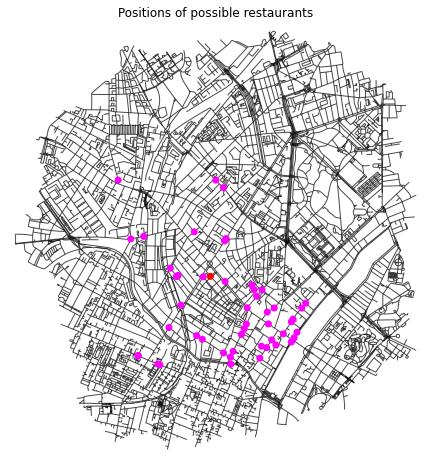

In [913]:

# create node weights
restaurant_node_weights = [50 if node in restaurant_nodes_and_current_position else 0 for node in U.nodes]
restaurant_node_colors = ['magenta' if node in restaurant_node_ids else 'red' if node == current_node else 'white' for node in U.nodes]

#nx.set_node_attributes(U, w, 'weight')

# We plot the nodes which minimizes the distance to the coordinates to check that the method works
fig, ax = ox.plot_graph(U, node_size=restaurant_node_weights, node_color = restaurant_node_colors,  edge_color="black", edge_linewidth=1, edge_alpha=0.7, bgcolor = 'white', show = False, close = False);

ax.set_title("Positions of possible restaurants")


**Bars**

In [797]:
# Converting the desinations coordinates into nodes which exist on our graph
bar_node_ids = get_nearest_nodes(bar_coords, U)
bar_nodes_and_current_position = bar_node_ids + [current_node]

# Add the information back into the gdf
bars["nearest node"] = bar_node_ids


/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


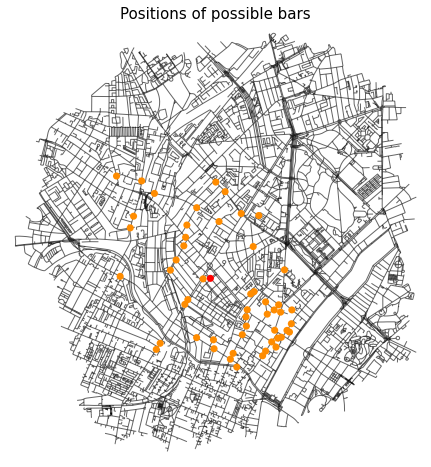

In [816]:
# create node weights
bar_node_weights = [50 if node in bar_nodes_and_current_position else 0 for node in U.nodes]
bar_node_colors = ['darkorange' if node in bar_node_ids else 'red' if node == current_node else 'white' for node in U.nodes]

#nx.set_node_attributes(U, w, 'weight')

# We plot the nodes which minimizes the distance to the coordinates to check that the method works
fig, ax = ox.plot_graph(U, node_size=bar_node_weights, node_color = bar_node_colors,  edge_color="black", edge_linewidth=1, edge_alpha=0.6, bgcolor = 'white', show = False, close = False);

ax.set_title("Positions of possible bars", fontsize = 15)

plt.show()



**Attractions**

In [814]:
# Converting the desinations coordinates into nodes which exist on our graph
attraction_node_ids = get_nearest_nodes(attraction_coords, U)
attraction_nodes_and_current_position = attraction_node_ids + [current_node]

# Add the information back into the gdf
attractions["nearest node"] = attraction_node_ids


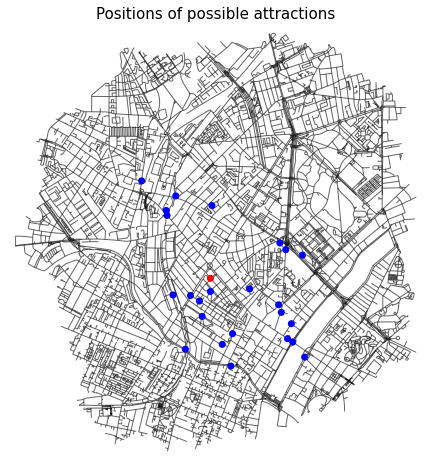

In [928]:
# create node weights
attraction_node_weights = [50 if node in attraction_nodes_and_current_position else 0 for node in U.nodes]
attraction_node_colors = ['blue' if node in attraction_node_ids else 'red' if node == current_node else 'white' for node in U.nodes]

#nx.set_node_attributes(U, w, 'weight')

# We plot the nodes which minimizes the distance to the coordinates to check that the method works
fig, ax = ox.plot_graph(U, node_size=attraction_node_weights, node_color = attraction_node_colors,  edge_color="black", edge_linewidth=1, edge_alpha=0.6, bgcolor = 'white', show = False, close = False);

ax.set_title("Positions of possible attractions", fontsize = 15)

plt.show()



#### Get distance to nearest park/water

min 7.270694999930754e-09 max 0.00025501229728998575 mean 2.1415168022940453e-06


<AxesSubplot:>

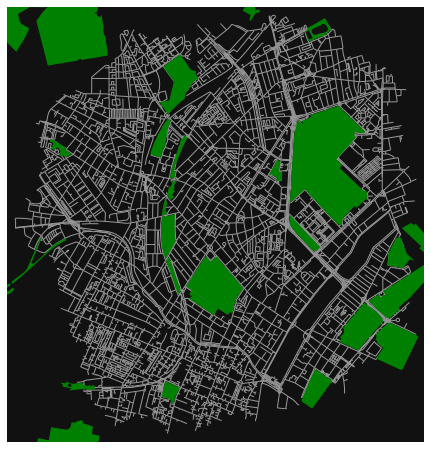

In [830]:
print("min", min(park_area_list),"max",  max(park_area_list),"mean", np.mean(park_area_list))

parks_subset = parks[parks["area"] > 2e-6]

# Let's quickly plot the destinations
fig, ax = ox.plot_graph(U, node_size=0, show=False, close=False);

parks_subset.plot(color="green", linewidth=1, ax=ax)

min 0.0 max 4.7464403254987425e-05 mean 2.540246972238537e-06


<AxesSubplot:>

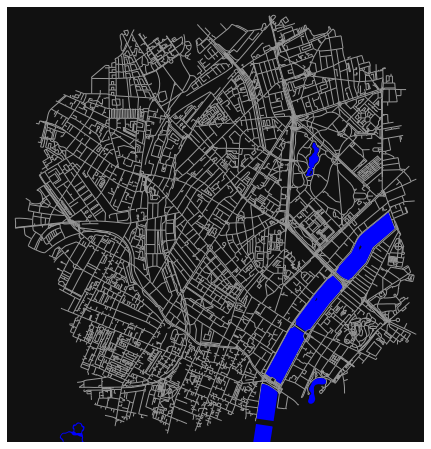

In [828]:

print("min", min(water_area_list),"max",  max(water_area_list),"mean", np.mean(water_area_list))

water_subset = water[water["area"] > 2e-6]

# Let's quickly plot the destinations
fig, ax = ox.plot_graph(U, node_size=0, show=False, close=False);

water_subset.plot(color="blue", linewidth=1, ax=ax)

In [847]:
# Function to calculate nearest distance to either the big water areas or the big park areas:

def dist_to_nearest_nature(coords, water, parks):
    polygons_water = water['geometry']
    polygons_parks = parks['geometry']
        
    # Find distance to nearest polygon
    min_distances_to_nature = []
    
    for coord in coords:
        coord = Point(coord[1], coord[0])
        # Water
        dist_to_waters = []
        for poly in polygons_water:
            if poly.geom_type == "Polygon": # Sometimes linestrings are returned, and these cannot be used
                distance = poly.exterior.distance(coord)
                dist_to_waters.append(distance)
            
            if poly.geom_type == "MultiPolygon":
                single_poly = poly.convex_hull
                distance = single_poly.exterior.distance(coord)
                dist_to_waters.append(distance)
        dist_to_nearest_water = min(dist_to_waters)
        
        # Park areas
        dist_to_parks = []
        
        for poly in polygons_parks:
            if poly.geom_type == "Polygon": # Sometimes linestrings are returned, and these cannot be used
                distance = poly.exterior.distance(coord)
                dist_to_parks.append(distance)
            
            if poly.geom_type == "MultiPolygon":
                single_poly = poly.convex_hull
                distance = single_poly.exterior.distance(coord)
                dist_to_parks.append(distance)
        dist_to_nearest_park = min(dist_to_parks)

        # Both
        dist_to_nearest_nature = min(dist_to_nearest_water, dist_to_nearest_park)
        min_distances_to_nature.append(dist_to_nearest_nature)
        
        # Apply to node attributes 
        data["dist_to_nature"] = dist_to_nearest_nature
    
    return min_distances_to_nature


**Get 10 restaurants closest to nature**

In [862]:
restaurants_distances_to_nature = dist_to_nearest_nature(restaurant_coords, water_subset, parks_subset) # Do it for restaurants etc.


# Apply to gdf
restaurants["dist_to_nature"] = restaurants_distances_to_nature

print("min", min(restaurants_distances_to_nature), "max", max(restaurants_distances_to_nature), "mean", np.mean(restaurants_distances_to_nature))



min 0.00022338416882054508 max 0.0068338319377446105 mean 0.0024208682994075665


In [889]:
# Old method using threshold

#threshold = 0.0025
#restaurant_node_ids_nature = [i for (i, j) in zip(restaurant_node_ids, restaurants_distances_to_nature) if j < threshold]

#print("We go from ", len(restaurant_node_ids), "restaurants to ", len(restaurant_node_ids_nature), "restaurants")




We go from  57 restaurants to  34 restaurants


In [908]:
# Get the indexes of the 10 destinations closest to nature: 

indexes_restaurants = np.argsort(restaurants_distances_to_nature)[:10]

restaurant_node_ids_nature = np.array(restaurant_node_ids)[indexes_restaurants] 


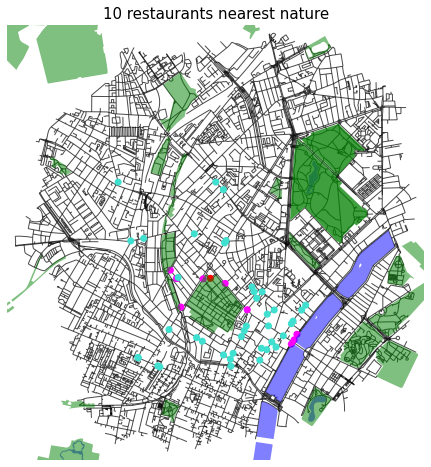

In [929]:
# create node weights
restaurant_node_weights = [50 if node in restaurant_nodes_and_current_position else 0 for node in U.nodes]
restaurant_node_colors = ['magenta' if (node in restaurant_node_ids_nature) else 'turquoise' if (node in restaurant_node_ids) else 'red' if node == current_node else 'white' for node in U.nodes]


# We plot the nodes which minimizes the distance to the coordinates to check that the method works
#fig, ax = ox.plot_graph(U, node_size=restaurant_node_weights, node_color = restaurant_node_colors,  edge_color="black", edge_linewidth=1, edge_alpha=0.7, bgcolor = 'white', show = False, close = False);


fig, ax = ox.plot_graph(U, node_size=restaurant_node_weights, node_color = restaurant_node_colors,  edge_color="black", edge_linewidth=1, edge_alpha=0.7, bgcolor = 'white', show = False, close = False);

water_subset.plot(color="blue", linewidth=1, ax=ax, alpha = 0.5)
parks_subset.plot(color="green", linewidth=1, ax=ax, alpha = 0.5)

ax.set_title("10 restaurants nearest nature", fontsize = 15)


plt.show()

**Get 10 bars closest to nature**


In [916]:
bars_distances_to_nature = dist_to_nearest_nature(bar_coords, water_subset, parks_subset) # Do it for restaurants etc.

# Apply to gdf
bars["dist_to_nature"] = bars_distances_to_nature




/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [917]:
# Get the indexes of the 10 bars closest to nature: 

indexes_bars = np.argsort(bars_distances_to_nature)[:10]

bars_node_ids_nature = np.array(bar_node_ids)[indexes_bars] 


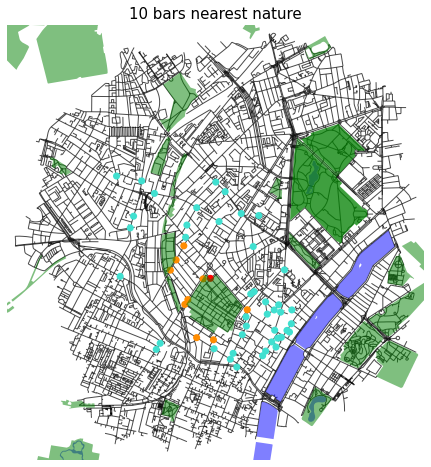

In [926]:
# create node weights
bar_node_weights = [50 if node in bar_nodes_and_current_position else 0 for node in U.nodes]
bar_node_colors = ['darkorange' if (node in bars_node_ids_nature) else 'turquoise' if (node in bar_node_ids) else 'red' if node == current_node else 'white' for node in U.nodes]


# We plot the nodes which minimizes the distance to the coordinates to check that the method works
#fig, ax = ox.plot_graph(U, node_size=restaurant_node_weights, node_color = restaurant_node_colors,  edge_color="black", edge_linewidth=1, edge_alpha=0.7, bgcolor = 'white', show = False, close = False);


fig, ax = ox.plot_graph(U, node_size=bar_node_weights, node_color = bar_node_colors,  edge_color="black", edge_linewidth=1, edge_alpha=0.7, bgcolor = 'white', show = False, close = False);

water_subset.plot(color="blue", linewidth=1, ax=ax, alpha = 0.5)
parks_subset.plot(color="green", linewidth=1, ax=ax, alpha = 0.5)

ax.set_title("10 bars nearest nature", fontsize = 15)


plt.show()

**Get 10 attractions closest to nature**


In [919]:
attractions_distances_to_nature = dist_to_nearest_nature(attraction_coords, water_subset, parks_subset) # Do it for restaurants etc.

# Apply to gdf
attractions["dist_to_nature"] = attractions_distances_to_nature




In [920]:
# Get the indexes of the 10 bars closest to nature: 

indexes_attractions = np.argsort(attractions_distances_to_nature)[:10]

attractions_node_ids_nature = np.array(attraction_node_ids)[indexes_attractions] 


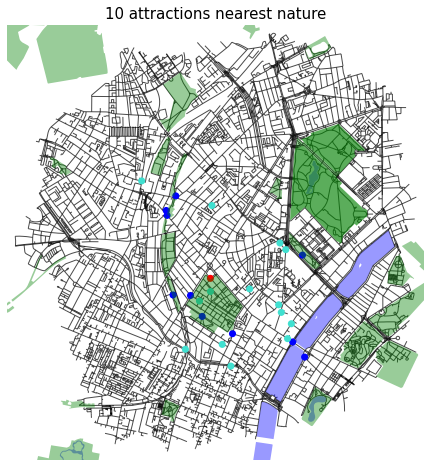

In [927]:
# create node weights
attraction_node_weights = [50 if node in attraction_nodes_and_current_position else 0 for node in U.nodes]
attraction_node_colors = ['blue' if (node in attractions_node_ids_nature) else 'turquoise' if (node in attraction_node_ids) else 'red' if node == current_node else 'white' for node in U.nodes]

fig, ax = ox.plot_graph(U, node_size=attraction_node_weights, node_color = attraction_node_colors,  edge_color="black", edge_linewidth=1, edge_alpha=0.7, bgcolor = 'white', show = False, close = False);

water_subset.plot(color="blue", linewidth=1, ax=ax, alpha = 0.4)
parks_subset.plot(color="green", linewidth=1, ax=ax, alpha = 0.4)

ax.set_title("10 attractions nearest nature", fontsize = 15)


plt.show()

# Calculating the route

In [590]:
route1 = ox.shortest_path(U, orig_id, dest_ids[0], weight="length")
route2 = ox.shortest_path(U, dest_ids[0], dest_ids[1], weight="length")
route3 = ox.shortest_path(U, dest_ids[1], dest_ids[2], weight="length")

routes = [route1, route2, route3]

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [591]:
route1_length = int(sum(ox.utils_graph.get_route_edge_attributes(U, route1, "length")))
route2_length = int(sum(ox.utils_graph.get_route_edge_attributes(U, route2, "length")))
route3_length = int(sum(ox.utils_graph.get_route_edge_attributes(U, route3, "length")))

print("The total route is", route1_length + route2_length + route3_length, "meters.")

The total route is 3681 meters.


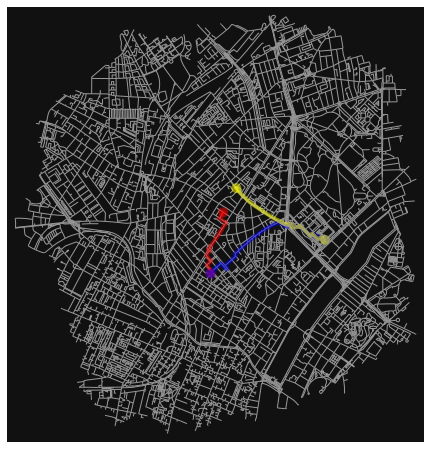

In [592]:
fig, ax = ox.plot_graph_routes(U, routes, route_colors=["red", "blue", "yellow"], node_size=0)


## Adding alternative edge attributes

In order to create nicer routes, we create route attributes which encourage the algorithm to choose routes based on other things than just the length of the route. 

We choose to use the following attributes:

- What is the primary use of the road
- What is the speed limit
- Is the edge in a green area?
- Is the edge near water?

In [593]:
## Here we just get an overview of the keys which exists in the edge data
total_dict = []

for u,v,key,data in U.edges(keys = True, data = True):
    total_dict.append(data)

    
from itertools import chain
  
# Function to print all unique keys present in a list of dictionaries
def UniqueKeys(arr):
  
    # Stores the list of unique keys
    res = list(set(chain.from_iterable(sub.keys() for sub in arr)))
  
    # Print the list
    print(str(res))

print("List of all possible keys in the edges we have avaiable in the current data set:\n")
UniqueKeys(total_dict)


List of all possible keys in the edges we have avaiable in the current data set:

['service', 'access', 'geometry', 'maxspeed', 'bridge', 'lanes', 'junction', 'width', 'name', 'oneway', 'ref', 'tunnel', 'length', 'highway', 'osmid', 'from', 'to']


/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Road use cost

Adding cost which takes into account the use of the road

In [594]:
# Here we look at the possible uses the edges can have, so we get to know our data better

highway_types = []

for u, v, key, data in U.edges(keys=True, data=True): 
    highway_types.append(str(data["highway"]))

highway_list = set(highway_types)
highway_list

{"['cycleway', 'path']",
 "['cycleway', 'residential']",
 "['cycleway', 'service']",
 "['footway', 'cycleway']",
 "['footway', 'living_street']",
 "['footway', 'path']",
 "['footway', 'residential', 'service']",
 "['footway', 'residential']",
 "['footway', 'service']",
 "['footway', 'steps', 'cycleway']",
 "['footway', 'steps', 'path']",
 "['footway', 'steps', 'residential']",
 "['footway', 'steps', 'service', 'path']",
 "['footway', 'steps', 'service']",
 "['footway', 'steps']",
 "['path', 'living_street']",
 "['pedestrian', 'path']",
 "['pedestrian', 'residential', 'path']",
 "['pedestrian', 'residential']",
 "['residential', 'living_street']",
 "['residential', 'path']",
 "['residential', 'service']",
 "['service', 'living_street']",
 "['service', 'path']",
 "['steps', 'path']",
 "['steps', 'residential']",
 "['steps', 'service', 'path']",
 "['steps', 'service']",
 "['track', 'residential']",
 "['unclassified', 'service']",
 'cycleway',
 'elevator',
 'footway',
 'living_street',
 'p

The roads we want to avoid are: tertiary, tertiary_link, primary

In [595]:
# Let's make a function for applying the cost of the road use

# Note: this code is heavily inspired from the exercise 8 solutions

def apply_road_use_cost(G, name_of_cost):
    for edge in G.edges:
        if ("primary" in G.edges[edge]["highway"]) or ("tertiary" in G.edges[edge]["highway"]) or ("tertiary_link" in G.edges[edge]["highway"]):
            G.edges[edge][name_of_cost] = G.edges[edge]["length"] * 2
        else:
            G.edges[edge][name_of_cost] = 0

In [596]:
# Let's try to apply it using the function

apply_road_use_cost(U, "use_cost")

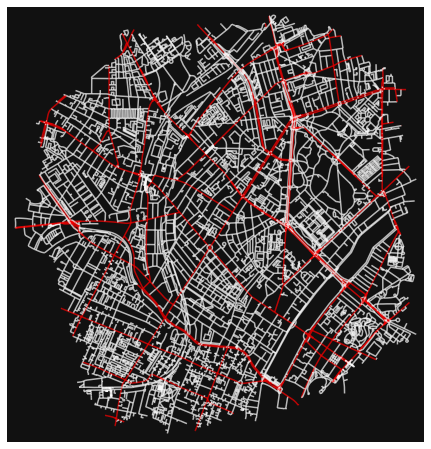

In [597]:
# Let's plot where the highway_cost is over 0 (after applying it)

highway_cost_applied = ["r" if data["use_cost"] > 0 else "w" for u, v, key, data in U.edges(keys=True, data=True)]
fig, ax = ox.plot_graph(U, node_size=0, edge_color=highway_cost_applied, edge_linewidth=1.5, edge_alpha=0.7)


### Road speed cost

We add an extra cost to roads which scale with the speed limit. The reason we do this, is that the road use cost mostly targets the biggest roads, and in this way we can also target medium roads. But the cost will be smaller now than in the road use cost.

We found that the difficult part here was that sometime the max_speed is listed as a list. This is probably due to the fact that OSMnx sinplifies the network, and that some edge attributes can be concatenated into a list if they are different. We choose to just use the biggest value in the list as the ground truth. 

This is taken care of in our road speed cost function.

In [598]:
# Let's make a function instead

def apply_speed_cost(G, name_of_cost):
    for edge in U.edges:
        if "maxspeed" in U.edges[edge]:
            if (type(U.edges[edge]["maxspeed"]) == list): # Here we take the biggest value, if more than one is listed
                float_list = [float(i) for i in U.edges[edge]["maxspeed"]]
                U.edges[edge][name_of_cost] = max(float_list)
            else: 
                U.edges[edge][name_of_cost] = float(U.edges[edge]["maxspeed"])
        else:
            U.edges[edge][name_of_cost] = 0

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [599]:
# Let's use the function

apply_speed_cost(U, "speed_cost")

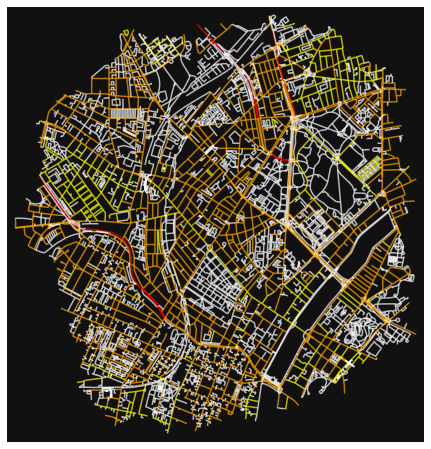

In [600]:
# Let's plot where the speed_cost is over 0 (after applying it)

speed_cost_applied = ["yellow" if (data["speed_cost"] > 0 and data["speed_cost"] < 50) else "orange" if data["speed_cost"] == 50 else "red" if data["speed_cost"] > 50 else "w" for u, v, key, data in U.edges(keys=True, data=True)]
fig, ax = ox.plot_graph(U, node_size=0, edge_color=speed_cost_applied, edge_linewidth=1.5, edge_alpha=0.7)


### Lower cost for green areas



In [601]:
# Get parks and cemetaries
parks = ox.geometries_from_point((55.6935280, 12.5489348), tags = {"leisure": "park", "landuse": "cemetery"}, dist=2500)


/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

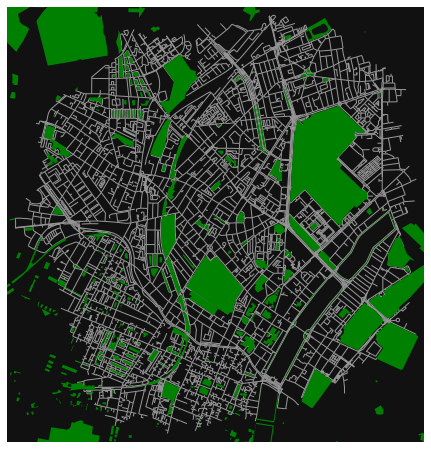

In [602]:
# Let's quickly plot the destinations
fig, ax = ox.plot_graph(U, node_size=0, show=False, close=False);

parks.plot(color="green", linewidth=1, ax=ax)

In [603]:
def apply_gain_to_edges_in_polygons(G, geometries, name_of_gain):
    polygons = geometries['geometry']
    
    nodes_in_polygons = []
    
    # Find nodes in polygons with within function from shapely
    
    for node, data in G.nodes(data = True):
        coord = Point(data["x"], data["y"])
        for poly in polygons:
            if coord.within(poly):
                nodes_in_polygons.append(node)
    
    # Apply edge weight to edges with ends in any of these nodes
    for edge in G.edges:
        if (edge[0] in nodes_in_polygons) or (edge[1] in nodes_in_polygons): 
            G.edges[edge][name_of_gain] = 0
        else: 
            G.edges[edge][name_of_gain] = 200

In [604]:
apply_gain_to_edges_in_polygons(U, parks, "park_gain")

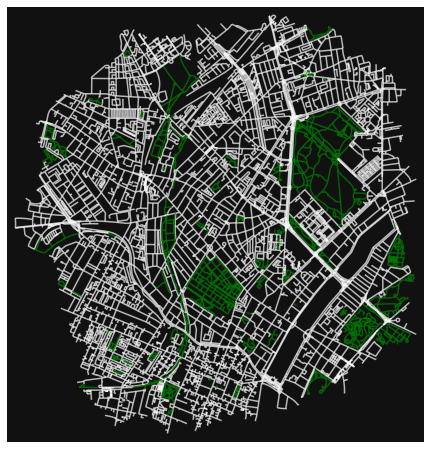

In [605]:
# Let's plot the park gain

park_gain_applied = ["green" if data["park_gain"] == 0 else "w" for u, v, key, data in U.edges(keys=True, data=True)]
fig, ax = ox.plot_graph(U, node_size=0, edge_color=park_gain_applied, edge_linewidth=1.5, edge_alpha=0.7)


### Lower cost for water areas

Thoughs: this one is extra difficult, since we cannot use the solution from the green areas, where we looked at nodes within the polygons, because there are very few nodes within the water areas. Another solution could be to use get_nearest_edge (or an approximation of this function, since it is not avaiable in this version of osmnx), but this would only return one edge per water area. 

We instead try calculate the distance from the nodes in the graph to the water polygons and then select all nodes which are less than some distance x to the polygons nearest edge. 

Some notes: water geometries can be both polygons, multipolugons and linestrings. 
Our function can handle polygons (using polygon.exterior.distance) and multipolygons if they can be converted to polygons (we use single_hull - see stackexchange). Linestrings are omitted.

https://gis.stackexchange.com/questions/180142/converting-shapely-multipolygon-to-polygon-technique-doesnt-always-work


In [606]:
water_tags = {"waterway": ["riverbank", "canal", "dock"],
        "water": ["river", "canal", "reservoir"],
        "natural": ["bay", "water"],
        "place": ["sea", "ocean"]}
water = ox.geometries_from_point((55.6935280, 12.5489348), tags = water_tags, dist=2500)


/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

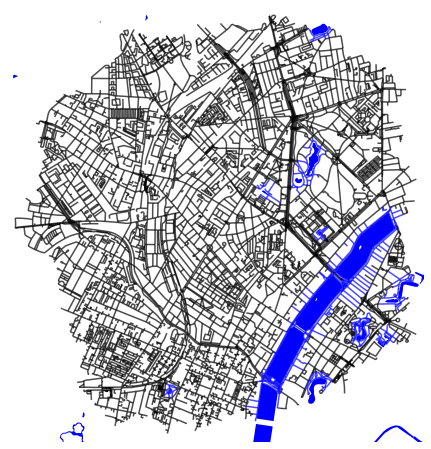

In [652]:
# Let's plot the water

fig, ax = ox.plot_graph(U, node_size=0, edge_color=water_gain_applied, edge_linewidth=1.5, edge_alpha=0.7, bgcolor = 'white', show = False, close = False)
water.plot(color="blue", linewidth=1, ax=ax)

In [607]:
def apply_gain_to_edges_near_polygons(G, geometries, name_of_gain):
    polygons = geometries['geometry']
    
    nodes_near_polygons = []
    
    # Find nodes in polygons with within function from shapely
    
    for node, data in G.nodes(data = True):
        coord = Point(data["x"], data["y"])
        for poly in polygons:
            if poly.geom_type == "Polygon": # Sometimes linestrings are returned, and these cannot be used
                distance = poly.exterior.distance(coord)

                if distance < 0.0005: #If distance is less than 0.5 meters (found empirically to be good)
                    nodes_near_polygons.append(node)
            
            if poly.geom_type == "MultiPolygon":
                single_poly = poly.convex_hull
                distance = single_poly.exterior.distance(coord)

                if distance < 0.0005: #If distance is less than 0.5 meters (found empirically to be good)
                    nodes_near_polygons.append(node)
                
    # Apply edge weight to edges with ends in any of these water nodes
    for edge in G.edges:
        if (edge[0] in nodes_near_polygons) or (edge[1] in nodes_near_polygons): 
            G.edges[edge][name_of_gain] = 0
        else: 
            G.edges[edge][name_of_gain] = 200

In [608]:
apply_gain_to_edges_near_polygons(U, water, "water_gain")

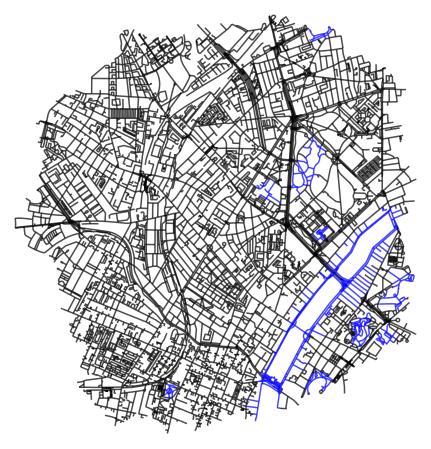

In [651]:
# Let's plot the water gain

water_gain_applied = ["blue" if data["water_gain"] == 0 else "black" for u, v, key, data in U.edges(keys=True, data=True)]
fig, ax = ox.plot_graph(U, node_size=0, edge_color=water_gain_applied, edge_linewidth=1.5, edge_alpha=0.7, bgcolor = 'white')


### Adding all the edge attributes together

In [628]:
def sum_edge_attributes(G, attributes):
    list_total_costs = []
    for u, v, key, data in G.edges(keys=True, data=True): 
        total_cost = 0
        for att in attributes:
            if (att != 'park_gain') and (att != 'water_gain'):
                total_cost = total_cost + data[att]
            else:
                total_cost = total_cost + data[att]
        data["total_cost"] = total_cost
        list_total_costs.append(total_cost)
    return list_total_costs

In [629]:
attributes = ['length', 'use_cost', 'speed_cost', 'park_gain', 'water_gain']


In [630]:
list_total_costs = sum_edge_attributes(U, attributes)


In [631]:
import matplotlib
import matplotlib.cm as cm
   
norm = matplotlib.colors.Normalize(vmin=min(list_total_costs), vmax=max(list_total_costs))
cmap = cm.bwr
m = cm.ScalarMappable(norm=norm, cmap=cmap)

edge_cost_colors = [m.to_rgba(data["total_cost"]) for u, v, key, data in U.edges(keys=True, data=True)]
 

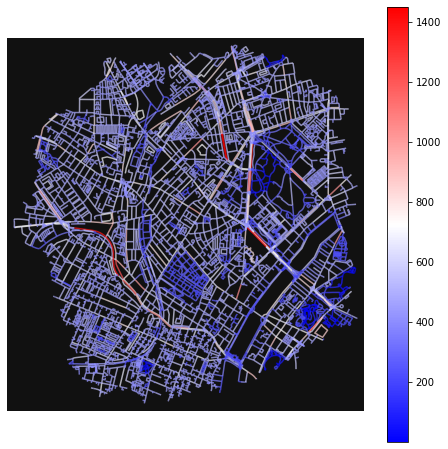

In [632]:
fig, ax = ox.plot_graph(U, node_size=0, edge_color=edge_cost_colors, edge_linewidth=1.5, edge_alpha=0.7,show=False, close=False)

fig.colorbar(m, ax = ax, orientation='vertical')
plt.show()

# Making a new route with the new attributes

The total route is 4376 meters.


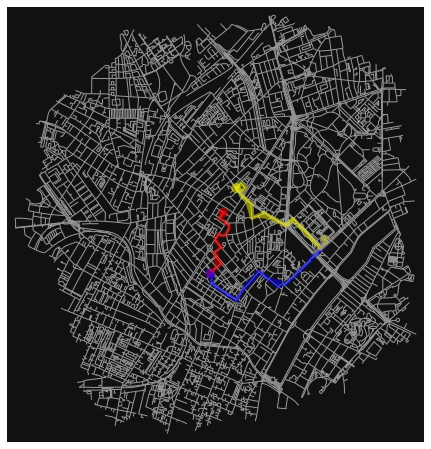

In [615]:
route1 = ox.shortest_path(U, orig_id, dest_ids[0], weight="total_cost")
route2 = ox.shortest_path(U, dest_ids[0], dest_ids[1], weight="total_cost")
route3 = ox.shortest_path(U, dest_ids[1], dest_ids[2], weight="total_cost")

routes = [route1, route2, route3]

route1_length = int(sum(ox.utils_graph.get_route_edge_attributes(U, route1, "length")))
route2_length = int(sum(ox.utils_graph.get_route_edge_attributes(U, route2, "length")))
route3_length = int(sum(ox.utils_graph.get_route_edge_attributes(U, route3, "length")))

print("The total route is", route1_length + route2_length + route3_length, "meters.")
fig, ax = ox.plot_graph_routes(U, routes, route_colors=["red", "blue", "yellow"], node_size=0)


In [735]:
# Look at node attributes

for node, data in U.nodes(data=True): 
    #data["k2"] = 2
    print(data)

{'y': 55.7133872, 'x': 12.5351605, 'street_count': 4, 'k': 1, 'k2': 2}
{'y': 55.7059502, 'x': 12.5216737, 'street_count': 4, 'k': 1, 'k2': 2}
{'y': 55.6811267, 'x': 12.5604964, 'highway': 'traffic_signals', 'street_count': 5, 'k': 1, 'k2': 2}
{'y': 55.6822531, 'x': 12.5576931, 'highway': 'traffic_signals', 'street_count': 4, 'k': 1, 'k2': 2}
{'y': 55.6849482, 'x': 12.5534141, 'highway': 'traffic_signals', 'street_count': 4, 'k': 1, 'k2': 2}
{'y': 55.6850602, 'x': 12.5518117, 'highway': 'traffic_signals', 'street_count': 4, 'k': 1, 'k2': 2}
{'y': 55.6853401, 'x': 12.5472859, 'highway': 'traffic_signals', 'street_count': 4, 'k': 1, 'k2': 2}
{'y': 55.6851171, 'x': 12.5503517, 'street_count': 4, 'k': 1, 'k2': 2}
{'y': 55.7039042, 'x': 12.5494528, 'street_count': 4, 'k': 1, 'k2': 2}
{'y': 55.7078207, 'x': 12.5564678, 'highway': 'traffic_signals', 'street_count': 4, 'k': 1, 'k2': 2}
{'y': 55.7071099, 'x': 12.5551863, 'street_count': 3, 'k': 1, 'k2': 2}
{'y': 55.7046887, 'x': 12.5508631, 'str

In [532]:
# Look at edge attributes

for u, v, key, data in U.edges(keys=True, data=True): 
    print(data)

{'osmid': 743336518, 'oneway': False, 'lanes': '4', 'name': 'Tagensvej', 'highway': 'tertiary', 'maxspeed': '50', 'length': 17.55, 'from': 3835639402, 'to': 125442, 'geometry': <shapely.geometry.linestring.LineString object at 0x7ff33576a7c0>, 'highway_cost': 35.1, 'speed_cost': 50.0, 'nature_gain': 0, 'use_cost': 35.1, 'test_cost': 35.1, 'speed_cost_test': 50.0, 'park_gain': 0, 'water_gain': 0, 'water_gain_test': 0, 'total_cost': 102.65}
{'osmid': [455570576, 455570571], 'oneway': True, 'lanes': ['2', '3'], 'ref': 'O2', 'name': 'Tuborgvej', 'highway': 'primary', 'maxspeed': '50', 'length': 111.036, 'geometry': <shapely.geometry.linestring.LineString object at 0x7ff315592fd0>, 'from': 125442, 'to': 26237008, 'highway_cost': 222.072, 'speed_cost': 50.0, 'nature_gain': 0, 'use_cost': 222.072, 'test_cost': 222.072, 'speed_cost_test': 50.0, 'park_gain': 0, 'water_gain': 0, 'water_gain_test': 0, 'total_cost': 383.108}
{'osmid': 742654119, 'oneway': False, 'lanes': '4', 'name': 'Tagensvej', 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



plot_path func from: 

https://towardsdatascience.com/find-and-plot-your-optimal-path-using-plotly-and-networkx-in-python-17e75387b873


In [ ]:
def plot_path(lat, long, origin_point, destination_point):
    
    """
    Given a list of latitudes and longitudes, origin 
    and destination point, plots a path on a map
    
    Parameters
    ----------
    lat, long: list of latitudes and longitudes
    origin_point, destination_point: co-ordinates of origin
    and destination
    Returns
    -------
    Nothing. Only shows the map.
    """
    # adding the lines joining the nodes
    fig = go.Figure(go.Scattermapbox(
        name = "Path",
        mode = "lines",
        lon = long,
        lat = lat,
        marker = {'size': 10},
        line = dict(width = 4.5, color = 'blue')))
    # adding source marker
    fig.add_trace(go.Scattermapbox(
        name = "Source",
        mode = "markers",
        lon = [origin_point[1]],
        lat = [origin_point[0]],
        marker = {'size': 12, 'color':"red"}))
     
    # adding destination marker
    fig.add_trace(go.Scattermapbox(
        name = "Destination",
        mode = "markers",
        lon = [destination_point[1]],
        lat = [destination_point[0]],
        marker = {'size': 12, 'color':'green'}))
    
    # getting center for plots:
    lat_center = np.mean(lat)
    long_center = np.mean(long)
    # defining the layout using mapbox_style
    fig.update_layout(mapbox_style="stamen-terrain",
        mapbox_center_lat = 30, mapbox_center_lon=-80)
    fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},
                      mapbox = {
                          'center': {'lat': lat_center, 
                          'lon': long_center},
                          'zoom': 13})
    fig.show()